# Diamond Price Prediction

In [27]:
#importing Libraires
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [28]:
df=pd.read_csv(r"D:\Forage2_powerBI\Datasets\Diamond Price Prediction.csv")
df.head()

,Carat(Weight of Daimond),Cut(Quality),Color,Clarity,Depth,Table,Price(in US dollars),X(length),Y(width),Z(Depth)
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [29]:
df.info()  #data information

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 10 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Carat(Weight of Daimond)  53940 non-null  float64
 1   Cut(Quality)              53940 non-null  object 
 2   Color                     53940 non-null  object 
 3   Clarity                   53940 non-null  object 
 4   Depth                     53940 non-null  float64
 5   Table                     53940 non-null  float64
 6   Price(in US dollars)      53940 non-null  int64  
 7   X(length)                 53940 non-null  float64
 8   Y(width)                  53940 non-null  float64
 9   Z(Depth)                  53940 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 4.1+ MB


In [30]:
df.describe()   #data description

,Carat(Weight of Daimond),Depth,Table,Price(in US dollars),X(length),Y(width),Z(Depth)
count,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000
mean,0.797940,61.749405,57.457184,3932.799722,5.731157,5.734526,3.538734
std,0.474011,1.432621,2.234491,3989.439738,1.121761,1.142135,0.705699
min,0.200000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,0.400000,61.000000,56.000000,950.000000,4.710000,4.720000,2.910000
50%,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,1.040000,62.500000,59.000000,5324.250000,6.540000,6.540000,4.040000
max,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


In [31]:
import plotly.express as px
import plotly.graph_objects as go

scatter_plot=px.scatter(data_frame=df,x="Carat(Weight of Daimond)",
                       y="Price(in US dollars)",
                       color="Cut(Quality)",trendline="ols",title="Scatter plot between Carat and Price")

scatter_plot.update_layout(width=800,height=500)
scatter_plot.show()



In [32]:
fig_color=px.box(df,x="Cut(Quality)",y="Price(in US dollars)",
                color="Color",title="Box plot for Cut(Quality and Price)")
fig_color.update_layout(width=800,height=500)
fig_color.show()

In [33]:
fig_price=px.box(df,x="Cut(Quality)",y="Price(in US dollars)",
                color="Clarity",title="Box Plot for Clarity and Price")
fig_price.update_layout(width=800,height=500)
fig_price.show()

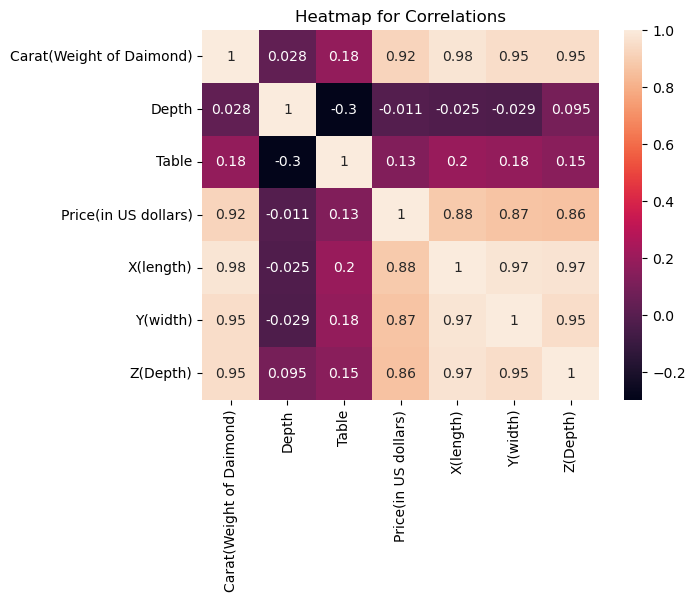

In [34]:
sns.heatmap(df.corr(),annot=True)
plt.title("Heatmap for Correlations")
plt.show()

In [35]:
df.value_counts(df["Cut(Quality)"])

Cut(Quality)
Ideal        21551
Premium      13791
Very Good    12082
Good          4906
Fair          1610
dtype: int64

In [36]:
df.value_counts(df["Color"])

Color
G    11292
E     9797
F     9542
H     8304
D     6775
I     5422
J     2808
dtype: int64

In [37]:
df.value_counts(df["Clarity"])

Clarity
SI1     13065
VS2     12258
SI2      9194
VS1      8171
VVS2     5066
VVS1     3655
IF       1790
I1        741
dtype: int64

In [38]:
#Mapping categorical values to numerical values
df["Cut(Quality)"]=df["Cut(Quality)"].map({"Ideal":1,
                                          "Premium":2,
                                          "Good":3,
                                          "Very Good":4,
                                          "Fair":5})

In [39]:
#Retrieving the features of the dataset
X=df.iloc[:,[0,1,7,8,9]].values
Y=df.iloc[:,5]

In [40]:
print("The highly correlated features are: \n",X)

The highly correlated features are: 
 [[0.23 1.   3.95 3.98 2.43]
 [0.21 2.   3.89 3.84 2.31]
 [0.23 3.   4.05 4.07 2.31]
 ...
 [0.7  4.   5.66 5.68 3.56]
 [0.86 2.   6.15 6.12 3.74]
 [0.75 1.   5.83 5.87 3.64]]


In [41]:
print("The Price column is: \n",Y)

The Price column is: 
 0        55.0
1        61.0
2        65.0
3        58.0
4        58.0
         ... 
53935    57.0
53936    55.0
53937    60.0
53938    58.0
53939    55.0
Name: Table, Length: 53940, dtype: float64


In [42]:
#standardizing the dataset
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
X=sc.fit_transform(X)
X

array([[-1.19816781, -0.97075349, -1.58783745, -1.53619556, -1.57112919],
       [-1.24036129, -0.18084199, -1.64132529, -1.65877419, -1.74117497],
       [-1.19816781,  0.6090695 , -1.49869105, -1.45739502, -1.74117497],
       ...,
       [-0.20662095,  1.398981  , -0.06343409, -0.04774083,  0.03013526],
       [ 0.13092691, -0.18084199,  0.37338325,  0.33750627,  0.28520393],
       [-0.10113725, -0.97075349,  0.08811478,  0.11861587,  0.14349912]])

In [43]:
from sklearn.model_selection import train_test_split
xtrain,xtest,ytrain,ytest=train_test_split(X,Y,test_size=0.2,random_state=1)

In [44]:
#Linaer Regression

from sklearn.linear_model import LinearRegression
regressor=LinearRegression()
regressor.fit(xtrain,ytrain)
y_pred1=regressor.predict(xtest)
print("the score for Linear Regression is :\n",regressor.score(xtest,ytest))

the score for Linear Regression is :
 0.21655712312475917


In [46]:
# Random Forest Regressor

from sklearn.ensemble import RandomForestRegressor
regressor2=RandomForestRegressor()
regressor2.fit(xtrain,ytrain)
y_pred1=regressor2.predict(xtest)
print("the score for Linear Regression is :\n",regressor2.score(xtest,ytest))

the score for Linear Regression is :
 0.5096354372448872
